Item Demand Forecasting

Problem Statement
Demand forecasts are fundamental to plan and deliver products and services. Accurate forecasting of demand can help the manufacturers to maintain appropriate stock which results in reduction in loss due to product not being sold and also reduces the opportunity cost (i.e. higher demand but less availability => opportunity lost). Despite such relevance, manufacturers have difficulty choosing which forecast model is the best for their use case. In this project, historical sales data corresponding to multiple(25) items sold in 10 stores are provided and participants are expected to come up with a best model to predict the future demand for products which results in maximum profit for the manufacturer. In general, the manufacturer incurs a loss of Rs. 10 for each item that is not sold (retention cost) and incurs an opportunity loss of Rs. 3 for excess demand. Predict the demand for the next 3 months at the item level (i.e. all the stores combined).

Data
The historical sales data is available here. The item, store and sales details are provided at the daily level for a period spanning 4 years. 

Minimum Requirements
The end objective of the participant is to produce a model that gives the best profit to the manufacturer (i..e strikes a balance between the opportunity cost and retention cost). Such a model must include the seasonality of the items sold. 




Referrences :
https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html

https://machinelearningmastery.com/hyperparameter-optimization-with-random-search-and-grid-search/

https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.GradientBoostingRegressor.html

# Let us begin the journey

Importing basic libraries

In [1]:
import numpy as np
import pandas as pd
import time
from matplotlib import pyplot as plt
import seaborn as sns
sns.set()
import warnings
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
warnings.filterwarnings('ignore')


Loading CSV file 

In [2]:
df=pd.read_csv("/content/train 2.csv")
df

,date,store,item,sales
0,2013-01-01,1,1,13
1,2013-01-02,1,1,11
2,2013-01-03,1,1,14
3,2013-01-04,1,1,13
4,2013-01-05,1,1,10
...,...,...,...,...
912995,2017-12-27,10,50,63
912996,2017-12-28,10,50,59
912997,2017-12-29,10,50,74
912998,2017-12-30,10,50,62


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 913000 entries, 0 to 912999
Data columns (total 4 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   date    913000 non-null  object
 1   store   913000 non-null  int64 
 2   item    913000 non-null  int64 
 3   sales   913000 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 27.9+ MB


No null values in the dataset . 
Date column is of data type "object" , let us convert it to datetime type

In [4]:
df['date']=pd.to_datetime(df['date'])

In [6]:
df.shape

(913000, 4)

In [7]:
df

,date,store,item,sales
0,2013-01-01,1,1,13
1,2013-01-02,1,1,11
2,2013-01-03,1,1,14
3,2013-01-04,1,1,13
4,2013-01-05,1,1,10
...,...,...,...,...
912995,2017-12-27,10,50,63
912996,2017-12-28,10,50,59
912997,2017-12-29,10,50,74
912998,2017-12-30,10,50,62


As we are not focusing on the Store details for prediction , We can remove store column

In [8]:

df.drop('store',axis='columns',inplace=True)

df

,date,item,sales
0,2013-01-01,1,13
1,2013-01-02,1,11
2,2013-01-03,1,14
3,2013-01-04,1,13
4,2013-01-05,1,10
...,...,...,...
912995,2017-12-27,50,63
912996,2017-12-28,50,59
912997,2017-12-29,50,74
912998,2017-12-30,50,62


In [10]:
df['date'].nunique()

1826

there are around 1826 unique dates in the data set , it is almost 5 years of data 

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 913000 entries, 0 to 912999
Data columns (total 3 columns):
 #   Column  Non-Null Count   Dtype         
---  ------  --------------   -----         
 0   date    913000 non-null  datetime64[ns]
 1   item    913000 non-null  int64         
 2   sales   913000 non-null  int64         
dtypes: datetime64[ns](1), int64(2)
memory usage: 20.9 MB


In [12]:
df.isna().any().sum()

0

We can notice that there are no null values in our data from the above two cells

In [13]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
item,913000.0,25.500000,14.430878,1.0,13.0,25.5,38.0,50.0
sales,913000.0,52.250287,28.801144,0.0,30.0,47.0,70.0,231.0


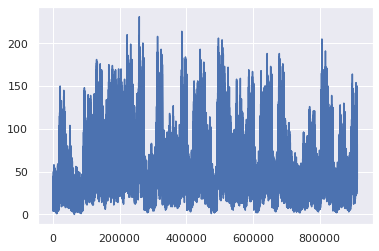

In [14]:
df["sales"].plot()

With this plot we can see sales of all items 

In [14]:
df["item"].value_counts()

1     18260
38    18260
28    18260
29    18260
30    18260
31    18260
32    18260
33    18260
34    18260
35    18260
36    18260
37    18260
39    18260
2     18260
40    18260
41    18260
42    18260
43    18260
44    18260
45    18260
46    18260
47    18260
48    18260
49    18260
27    18260
26    18260
25    18260
24    18260
3     18260
4     18260
5     18260
6     18260
7     18260
8     18260
9     18260
10    18260
11    18260
12    18260
13    18260
14    18260
15    18260
16    18260
17    18260
18    18260
19    18260
20    18260
21    18260
22    18260
23    18260
50    18260
Name: item, dtype: int64

There are equal number of records in dataset for all the items 

In [16]:
df['date'].describe()

count                  913000
unique                   1826
top       2013-01-01 00:00:00
freq                      500
first     2013-01-01 00:00:00
last      2017-12-31 00:00:00
Name: date, dtype: object

In [15]:
df['date'].value_counts()

2013-01-01    500
2016-05-11    500
2016-05-09    500
2016-05-08    500
2016-05-07    500
             ... 
2014-08-29    500
2014-08-28    500
2014-08-27    500
2014-08-26    500
2017-12-31    500
Name: date, Length: 1826, dtype: int64

There are equal number of records for all the dates

Ley us check the item wise sales for all dates 

In [16]:
df = df.groupby(['date','item']).sum()

In [17]:
df.head(10)

sales
date       item       
2013-01-01 1       133
           2       327
           3       172
           4       102
           5        83
           6       288
           7       278
           8       416
           9       245
           10      378

In [18]:
df = df.reset_index()
df.head()

,date,item,sales
0,2013-01-01,1,133
1,2013-01-01,2,327
2,2013-01-01,3,172
3,2013-01-01,4,102
4,2013-01-01,5,83


Function to take data of sales summed at 90 days level

In [19]:
def func(item_df):
  temp_index = item_df['date']
  item_df["sales"] = item_df["sales"].rolling(window=90).sum().shift(-90)
  item_df['date'] = temp_index
  return item_df

Applying the above function at Item level

In [20]:
df = df.groupby(['item']).apply(lambda item_df: func(item_df))

In [21]:
df.head(10)

,date,item,sales
0,2013-01-01,1,12848.0
1,2013-01-01,2,34724.0
2,2013-01-01,3,21472.0
3,2013-01-01,4,12940.0
4,2013-01-01,5,10678.0
5,2013-01-01,6,34380.0
6,2013-01-01,7,34470.0
7,2013-01-01,8,45320.0
8,2013-01-01,9,30547.0
9,2013-01-01,10,42939.0


In [22]:
df['date'].max()


Timestamp('2017-12-31 00:00:00')

In [23]:
df['date'].min()

Timestamp('2013-01-01 00:00:00')

Creating a function to get more features from date in order to capture the seasonality of the data.

In [24]:
def create_date_features(df):
    df['month'] = df.date.dt.month
    df['week_of_year'] = df.date.dt.weekofyear
    df['day_of_week'] = df.date.dt.dayofweek
    df['year'] = df.date.dt.year
    df['is_wknd'] = df.date.dt.weekday // 4  # Also included Friday as weekend
    df['is_month_start'] = df.date.dt.is_month_start.astype(int)
    df['is_month_end'] = df.date.dt.is_month_end.astype(int)
    df['quarter'] = df.date.dt.quarter
    df['is_quarter_start'] = df.date.dt.is_quarter_start.astype(int)
    df['is_quarter_end'] = df.date.dt.is_quarter_end.astype(int)
    
    return df

In [25]:
df = create_date_features(df)


In [26]:
df

,date,item,sales,month,week_of_year,day_of_week,year,is_wknd,is_month_start,is_month_end,quarter,is_quarter_start,is_quarter_end
0,2013-01-01,1,12848.0,1,1,1,2013,0,1,0,1,1,0
1,2013-01-01,2,34724.0,1,1,1,2013,0,1,0,1,1,0
2,2013-01-01,3,21472.0,1,1,1,2013,0,1,0,1,1,0
3,2013-01-01,4,12940.0,1,1,1,2013,0,1,0,1,1,0
4,2013-01-01,5,10678.0,1,1,1,2013,0,1,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
91295,2017-12-31,46,NaN,12,52,6,2017,1,0,1,4,0,1
91296,2017-12-31,47,NaN,12,52,6,2017,1,0,1,4,0,1
91297,2017-12-31,48,NaN,12,52,6,2017,1,0,1,4,0,1
91298,2017-12-31,49,NaN,12,52,6,2017,1,0,1,4,0,1


In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 91300 entries, 0 to 91299
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   date              91300 non-null  datetime64[ns]
 1   item              91300 non-null  int64         
 2   sales             86800 non-null  float64       
 3   month             91300 non-null  int64         
 4   week_of_year      91300 non-null  int64         
 5   day_of_week       91300 non-null  int64         
 6   year              91300 non-null  int64         
 7   is_wknd           91300 non-null  int64         
 8   is_month_start    91300 non-null  int64         
 9   is_month_end      91300 non-null  int64         
 10  quarter           91300 non-null  int64         
 11  is_quarter_start  91300 non-null  int64         
 12  is_quarter_end    91300 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(11)
memory usage: 11.8 MB


In [28]:
df['item']=df['item'].astype(int)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 91300 entries, 0 to 91299
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   date              91300 non-null  datetime64[ns]
 1   item              91300 non-null  int64         
 2   sales             86800 non-null  float64       
 3   month             91300 non-null  int64         
 4   week_of_year      91300 non-null  int64         
 5   day_of_week       91300 non-null  int64         
 6   year              91300 non-null  int64         
 7   is_wknd           91300 non-null  int64         
 8   is_month_start    91300 non-null  int64         
 9   is_month_end      91300 non-null  int64         
 10  quarter           91300 non-null  int64         
 11  is_quarter_start  91300 non-null  int64         
 12  is_quarter_end    91300 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(11)
memory usage: 11.8 MB


In [29]:
item_list=(df["item"].unique())

In [31]:
type(item_list[0])

numpy.int64

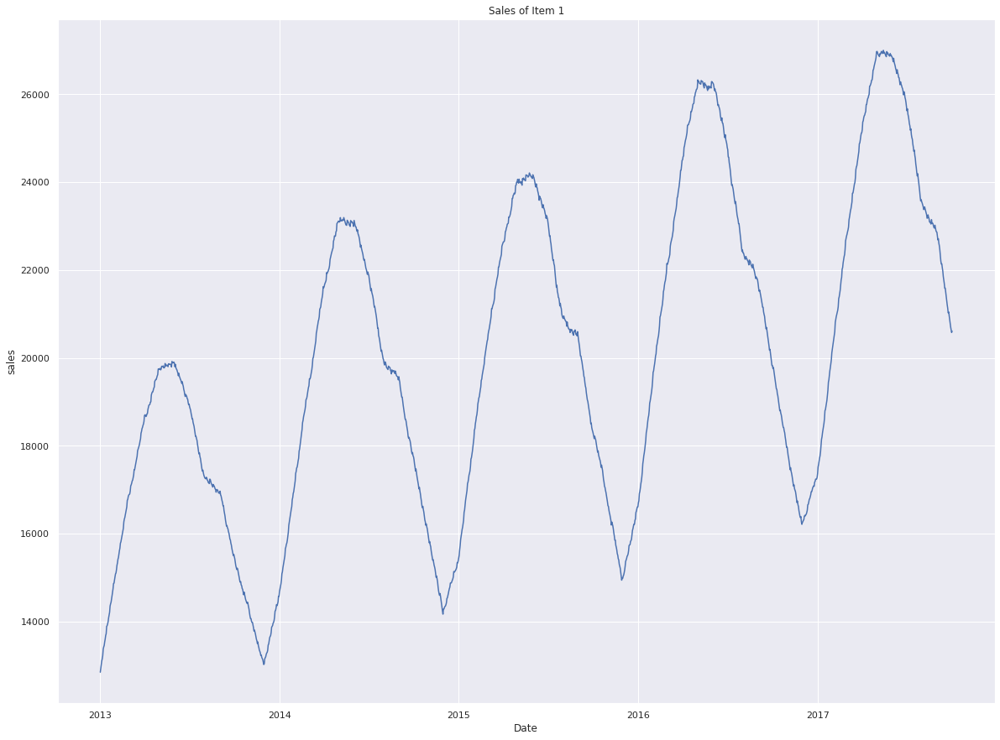

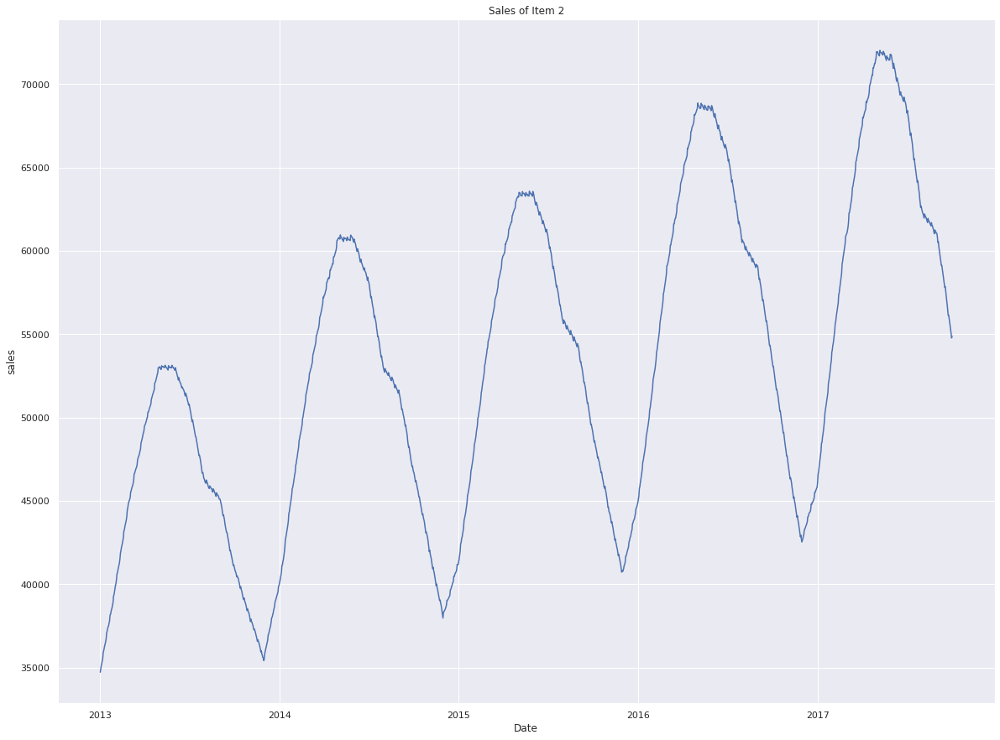

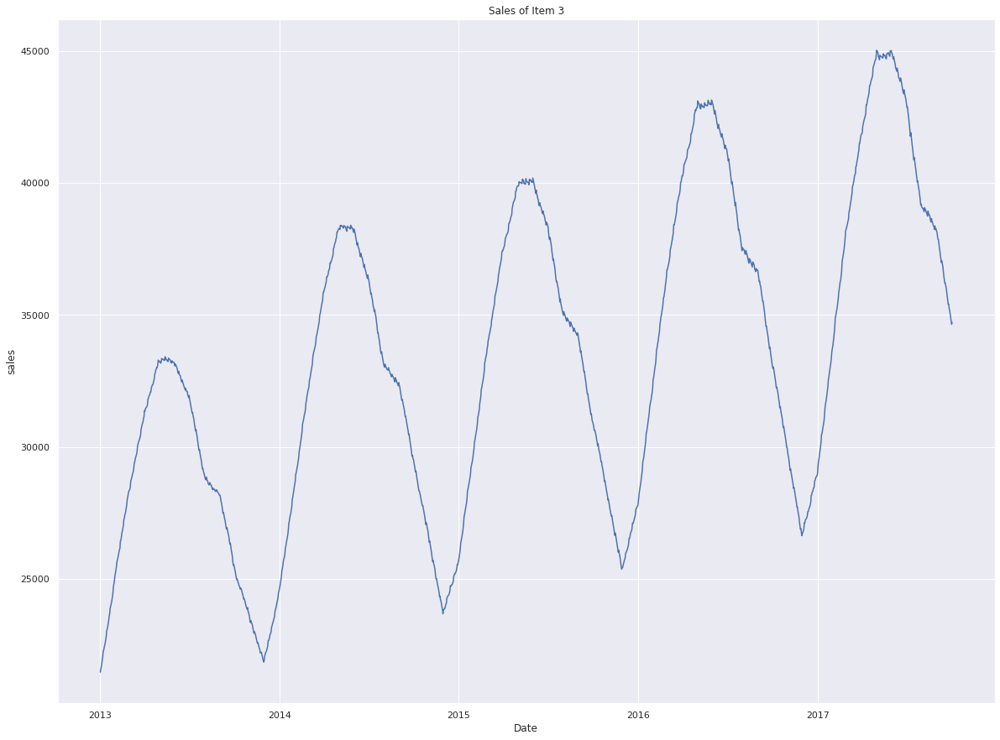

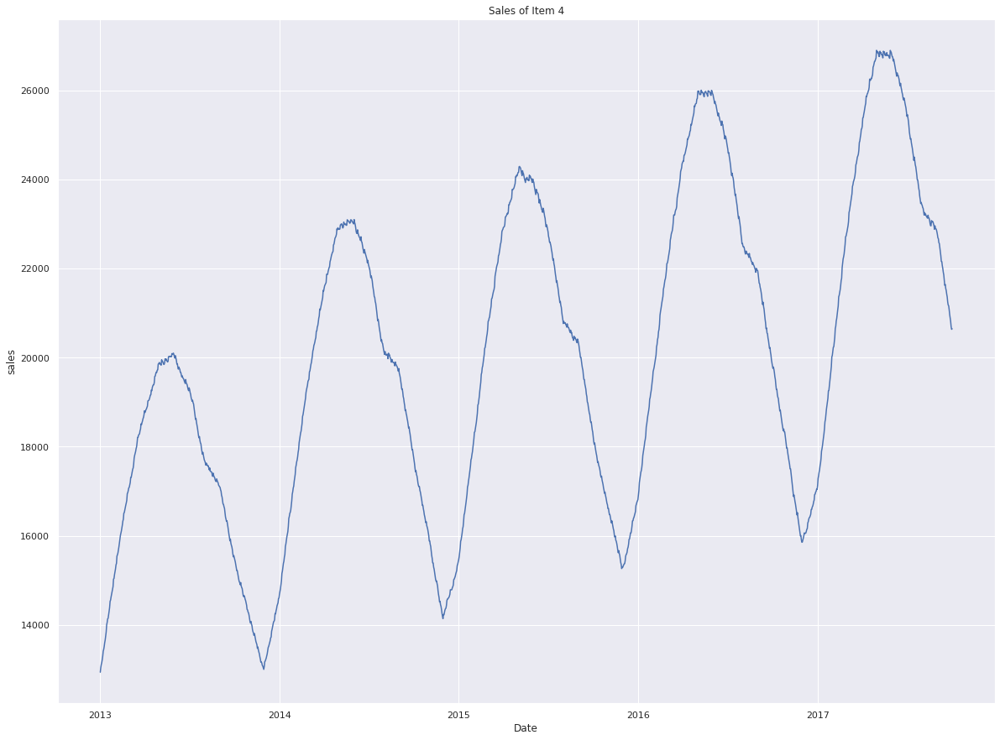

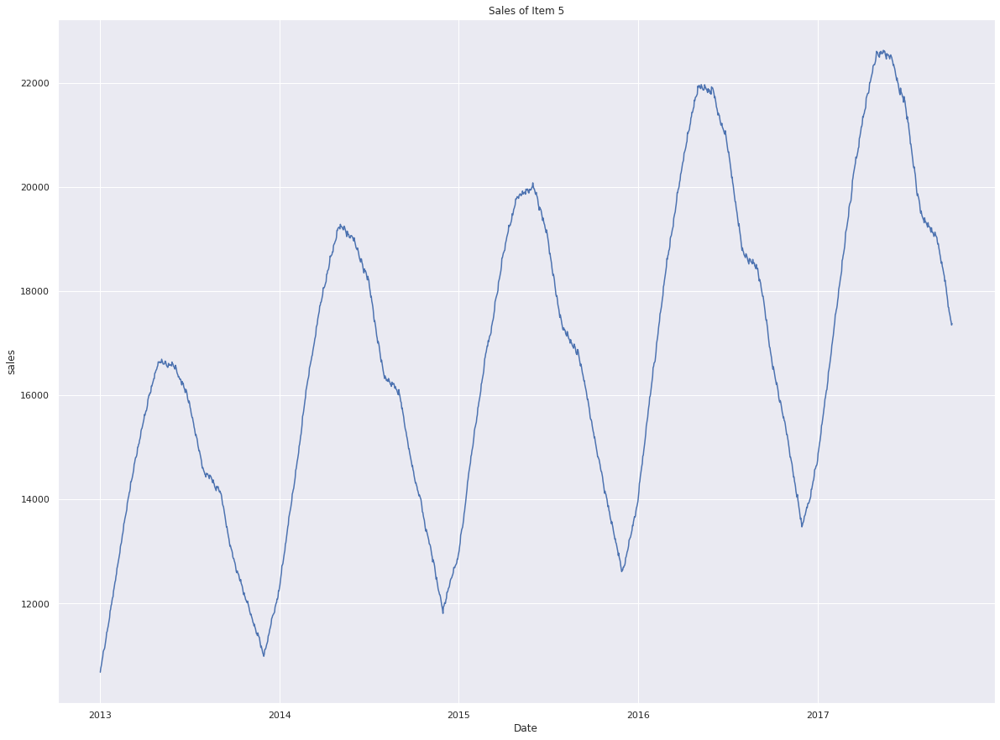

...

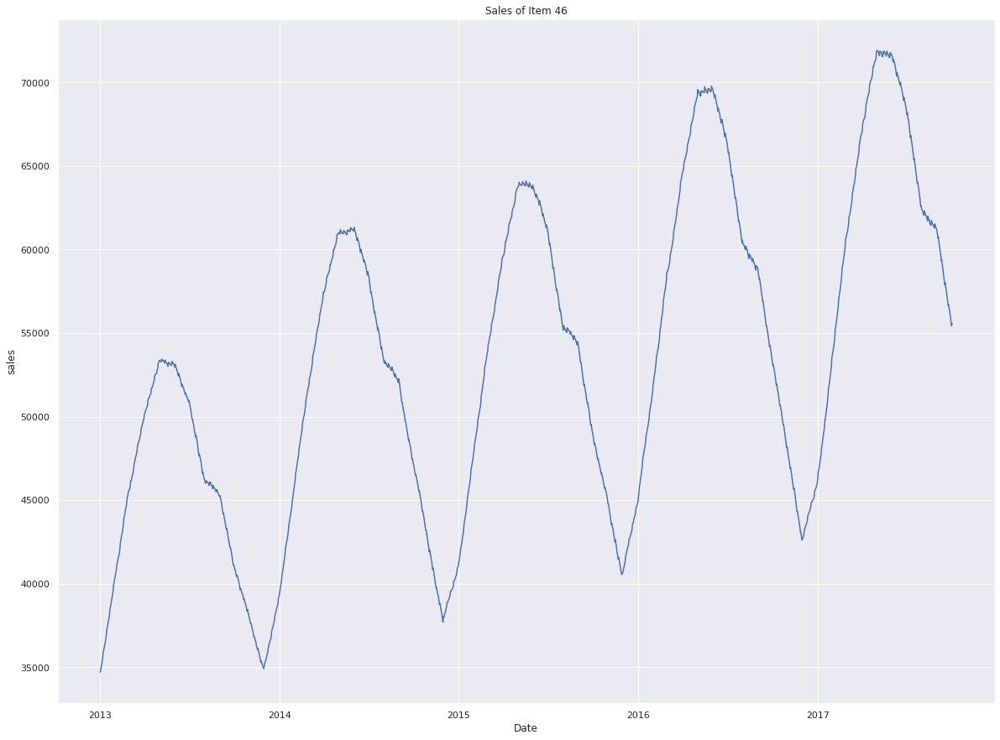

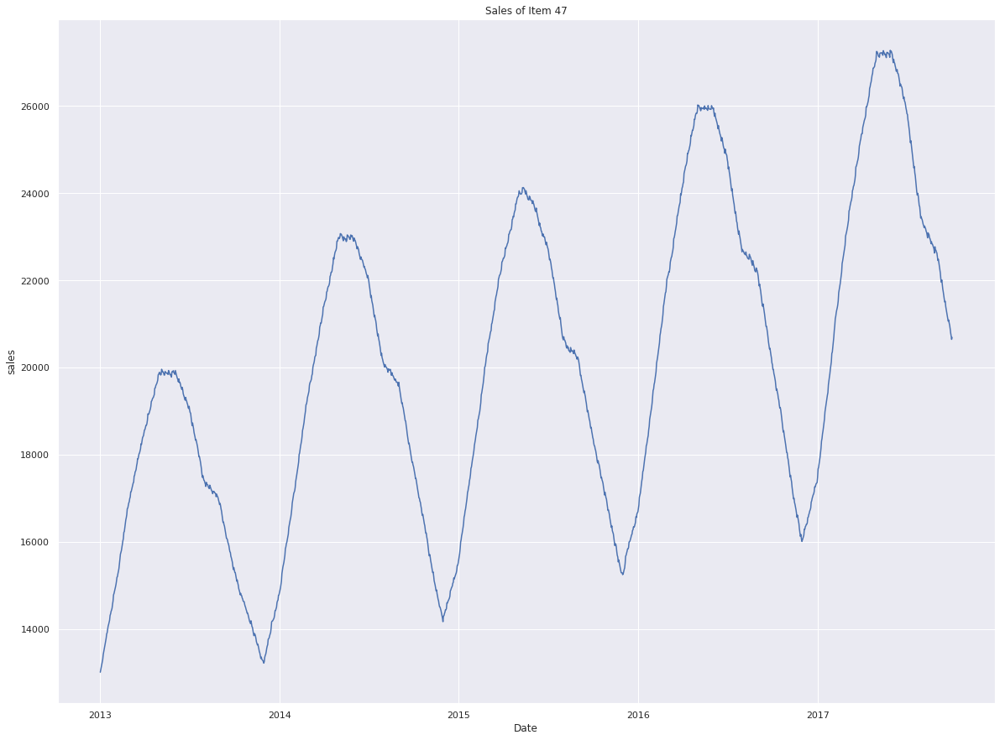

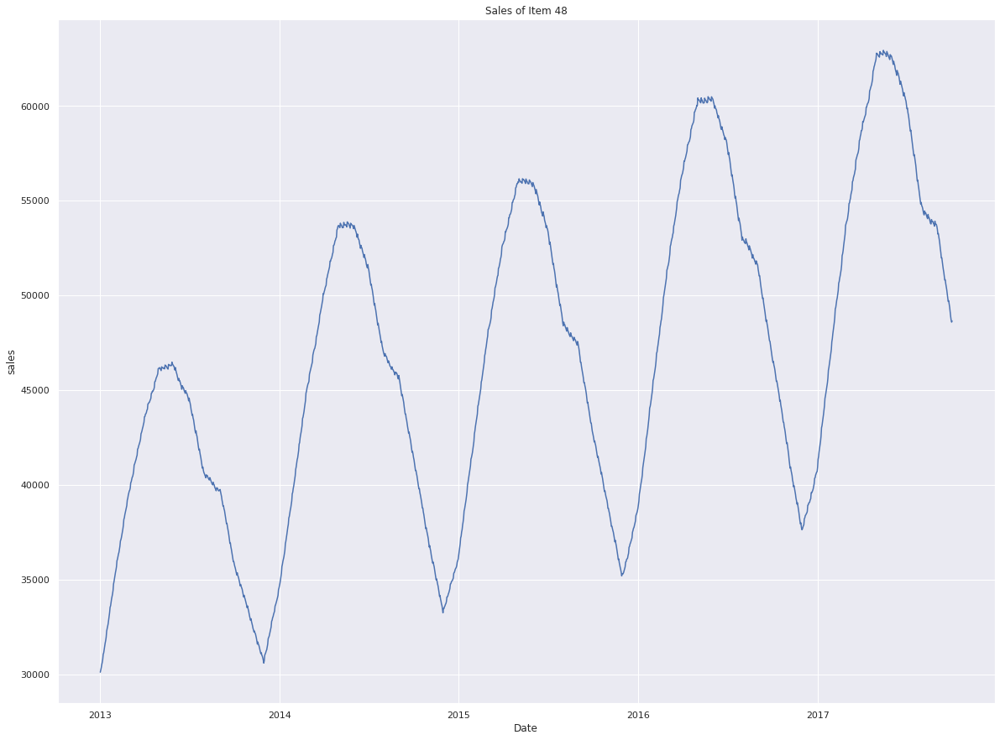

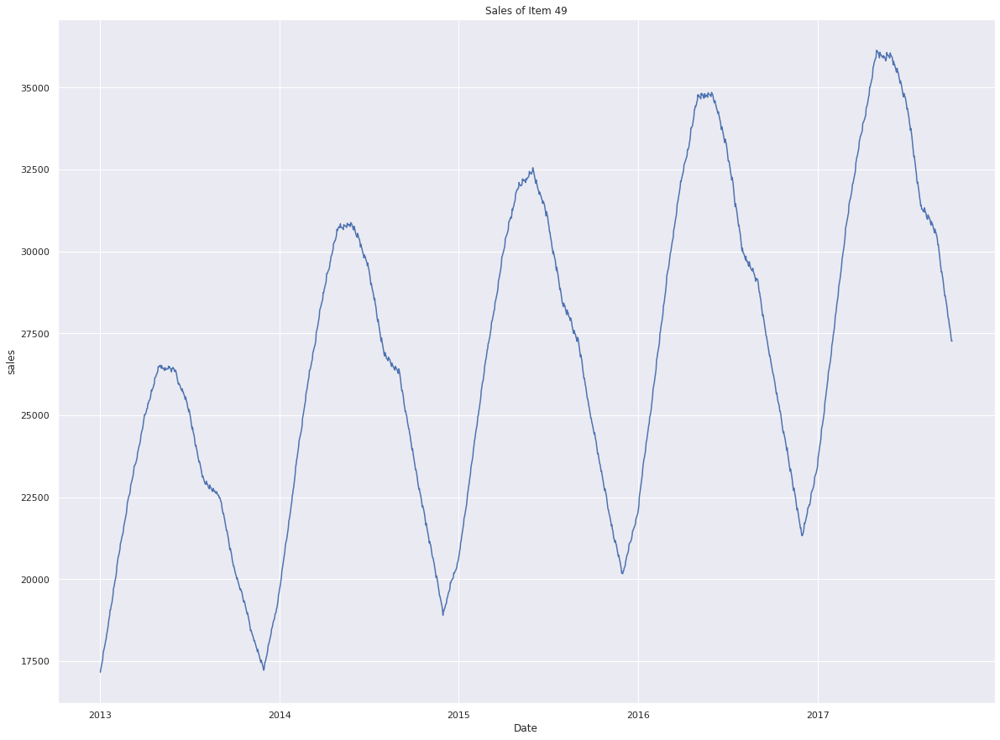

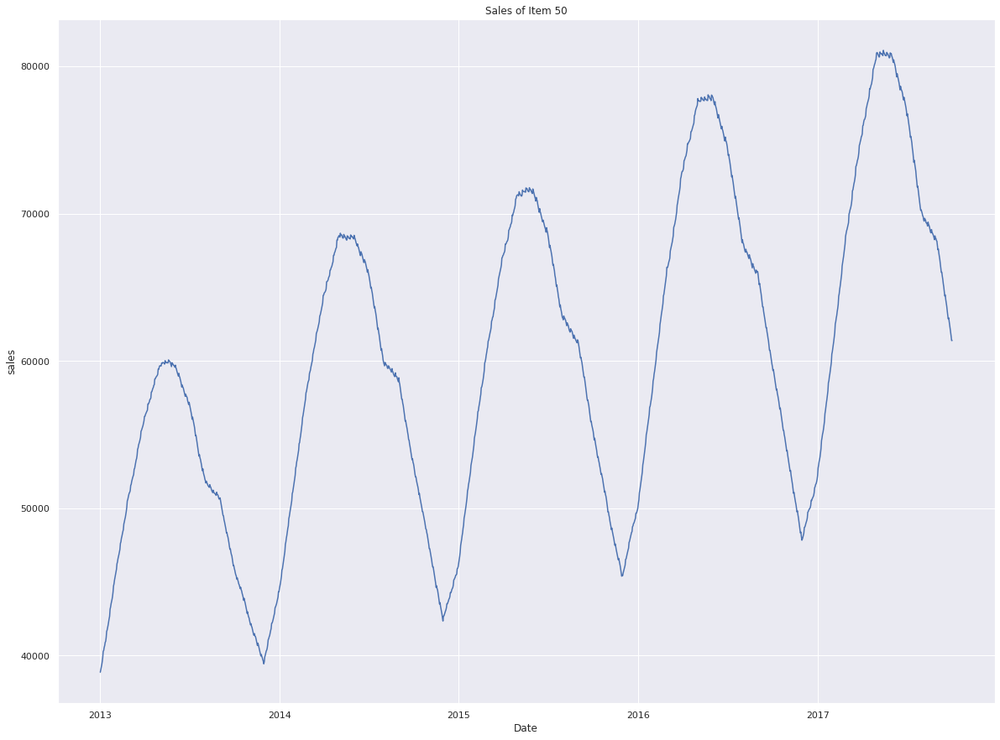

In [33]:
for i in item_list:
  plot_df=df[df["item"]==i]
  plt.figure(figsize=((20,15)))
  plt.grid(True)
  
  plt.plot(plot_df['date'],plot_df["sales"])
  plt.title("Sales of Item "+str(i))
  plt.xlabel("Date")
  plt.ylabel("sales")
  plt.show()

We can notice the data is having seasonality patterns.

Time based train test split

In [34]:
df_train=df[df['date']<='2017-07-02 00:00:00']

In [35]:
df_train.tail()

,date,item,sales,month,week_of_year,day_of_week,year,is_wknd,is_month_start,is_month_end,quarter,is_quarter_start,is_quarter_end
82195,2017-07-02,46,68072.0,7,26,6,2017,1,0,0,3,0,0
82196,2017-07-02,47,25823.0,7,26,6,2017,1,0,0,3,0,0
82197,2017-07-02,48,59851.0,7,26,6,2017,1,0,0,3,0,0
82198,2017-07-02,49,34341.0,7,26,6,2017,1,0,0,3,0,0
82199,2017-07-02,50,76656.0,7,26,6,2017,1,0,0,3,0,0


In [36]:
df_valid=df[(df['date']>'2017-07-02 00:00:00') & (df['date']<'2017-10-03 00:00:00')]

In [37]:
df_valid.head()

,date,item,sales,month,week_of_year,day_of_week,year,is_wknd,is_month_start,is_month_end,quarter,is_quarter_start,is_quarter_end
82200,2017-07-03,1,25667.0,7,27,0,2017,0,0,0,3,0,0
82201,2017-07-03,2,68421.0,7,27,0,2017,0,0,0,3,0,0
82202,2017-07-03,3,42876.0,7,27,0,2017,0,0,0,3,0,0
82203,2017-07-03,4,25451.0,7,27,0,2017,0,0,0,3,0,0
82204,2017-07-03,5,21350.0,7,27,0,2017,0,0,0,3,0,0


In [38]:
df_valid.tail()

,date,item,sales,month,week_of_year,day_of_week,year,is_wknd,is_month_start,is_month_end,quarter,is_quarter_start,is_quarter_end
86795,2017-10-02,46,55565.0,10,40,0,2017,0,0,0,4,0,0
86796,2017-10-02,47,20692.0,10,40,0,2017,0,0,0,4,0,0
86797,2017-10-02,48,48651.0,10,40,0,2017,0,0,0,4,0,0
86798,2017-10-02,49,27275.0,10,40,0,2017,0,0,0,4,0,0
86799,2017-10-02,50,61395.0,10,40,0,2017,0,0,0,4,0,0


In [39]:
df_train_x=df_train.drop(["date","sales"],axis='columns')

In [40]:
df_train_x

,item,month,week_of_year,day_of_week,year,is_wknd,is_month_start,is_month_end,quarter,is_quarter_start,is_quarter_end
0,1,1,1,1,2013,0,1,0,1,1,0
1,2,1,1,1,2013,0,1,0,1,1,0
2,3,1,1,1,2013,0,1,0,1,1,0
3,4,1,1,1,2013,0,1,0,1,1,0
4,5,1,1,1,2013,0,1,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...
82195,46,7,26,6,2017,1,0,0,3,0,0
82196,47,7,26,6,2017,1,0,0,3,0,0
82197,48,7,26,6,2017,1,0,0,3,0,0
82198,49,7,26,6,2017,1,0,0,3,0,0


In [41]:
df_train_x.shape





(82200, 11)

In [42]:
df_train_y=df_train["sales"]
df_train_y

0        12848.0
1        34724.0
2        21472.0
3        12940.0
4        10678.0
          ...   
82195    68072.0
82196    25823.0
82197    59851.0
82198    34341.0
82199    76656.0
Name: sales, Length: 82200, dtype: float64

In [43]:
df_train_y.shape

(82200,)

In [44]:
df_valid_x=df_valid.drop(["date","sales"],axis="columns")

In [45]:
df_valid_y=df_valid["sales"]

In [46]:
df_valid_x.shape

(4600, 11)

In [47]:
df_valid_y.shape

(4600,)

In [48]:
df_test=df[df['date']>'2017-10-02 00:00:00']

In [49]:
df_test

,date,item,sales,month,week_of_year,day_of_week,year,is_wknd,is_month_start,is_month_end,quarter,is_quarter_start,is_quarter_end
86800,2017-10-03,1,NaN,10,40,1,2017,0,0,0,4,0,0
86801,2017-10-03,2,NaN,10,40,1,2017,0,0,0,4,0,0
86802,2017-10-03,3,NaN,10,40,1,2017,0,0,0,4,0,0
86803,2017-10-03,4,NaN,10,40,1,2017,0,0,0,4,0,0
86804,2017-10-03,5,NaN,10,40,1,2017,0,0,0,4,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
91295,2017-12-31,46,NaN,12,52,6,2017,1,0,1,4,0,1
91296,2017-12-31,47,NaN,12,52,6,2017,1,0,1,4,0,1
91297,2017-12-31,48,NaN,12,52,6,2017,1,0,1,4,0,1
91298,2017-12-31,49,NaN,12,52,6,2017,1,0,1,4,0,1


In [50]:
df_pred=df_test.drop(["sales"],axis='columns')

In [51]:
df_test_x=df_test.drop(["date","sales"],axis='columns')

In [52]:
df_test_x.shape

(4500, 11)

In [53]:
df_test_x

,item,month,week_of_year,day_of_week,year,is_wknd,is_month_start,is_month_end,quarter,is_quarter_start,is_quarter_end
86800,1,10,40,1,2017,0,0,0,4,0,0
86801,2,10,40,1,2017,0,0,0,4,0,0
86802,3,10,40,1,2017,0,0,0,4,0,0
86803,4,10,40,1,2017,0,0,0,4,0,0
86804,5,10,40,1,2017,0,0,0,4,0,0
...,...,...,...,...,...,...,...,...,...,...,...
91295,46,12,52,6,2017,1,0,1,4,0,1
91296,47,12,52,6,2017,1,0,1,4,0,1
91297,48,12,52,6,2017,1,0,1,4,0,1
91298,49,12,52,6,2017,1,0,1,4,0,1


Using gradient boost regressor

In [54]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score

In [55]:
from sklearn import ensemble
gbr=ensemble.GradientBoostingRegressor(random_state=0,verbose=2.5)
gbr

GradientBoostingRegressor(random_state=0, verbose=2.5)

Using Grid Search to tune the hyper parameters on Validation set.

In [56]:

space={'n_estimators':[100,150,200],
'learning_rate':[0.05,0.07,0.1,0.15],
'max_depth':[10,15,20]}
search=GridSearchCV(gbr,space,scoring='r2',return_train_score=True)

In [57]:
%%time
result=search.fit(df_valid_x,df_valid_y)

Streaming output truncated to the last 5000 lines.
       135         217.2147            0.42s
       136         216.3782            0.41s
       137         205.7438            0.40s
       138         203.8898            0.40s
       139         202.3426            0.39s
       140         187.2706            0.38s
       141         173.4047            0.38s
       142         171.9851            0.37s
       143         160.6358            0.37s
       144         159.9216            0.36s
       145         158.4024            0.36s
       146         151.9361            0.35s
       147         146.1917            0.34s
       148         144.8078            0.34s
       149         143.9709            0.33s
       150         137.4583            0.32s
       151         135.8678            0.32s
       152         121.7601            0.31s
       153         121.4641            0.30s
       154         108.4273            0.30s
       155         107.4932            0.29s
    

In [58]:
print(result.best_params_)

{'learning_rate': 0.1, 'max_depth': 10, 'n_estimators': 200}


Using the best parameters to fit the model on training set

In [59]:
gbr_final=ensemble.GradientBoostingRegressor(learning_rate=0.1,max_depth=10,n_estimators=200,random_state=0,verbose=2.5)

In [60]:
gbr_final.fit(df_train_x,df_train_y)

      Iter       Train Loss   Remaining Time 
         1   390582139.7743           32.25s
         2   340123533.2962           31.88s
         3   298193746.1699           31.19s
         4   263331885.7406           31.57s
         5   234843702.9453           30.68s
         6   210632364.2188           30.31s
         7   190797767.2200           29.87s
         8   174363405.3577           29.84s
         9   157445078.4980           29.40s
        10   145667504.8362           29.10s
        11   135601676.0244           28.95s
        12   123119754.8267           28.78s
        13   101681676.8930           28.68s
        14    84198796.6717           28.65s
        15    70881558.2335           28.46s
        16    63087935.0767           28.14s
        17    54990121.3228           27.95s
        18    49684834.9132           27.66s
        19    45709545.1995           27.40s
        20    42320494.7380           27.18s
        21    37021500.0808           27.03s
        2

GradientBoostingRegressor(max_depth=10, n_estimators=200, random_state=0,
                          verbose=2.5)

Checking model performance on Train and validation sets

In [61]:
gbr_final.score(df_train_x,df_train_y)

0.9998940362174152

In [68]:
gbr_final.score(df_valid_x,df_valid_y)

0.9978359497610645

In [69]:
y_pred=gbr_final.predict(df_test_x)

In [70]:
y_pred

array([19717.34004433, 53564.49444863, 33147.29812376, ...,
       43739.03313277, 25452.88895235, 53003.10262929])

In [71]:
y_pred.shape

(4500,)

In [72]:
df_pred["Prediction"]=y_pred

In [73]:
df_pred

,date,item,month,week_of_year,day_of_week,year,is_wknd,is_month_start,is_month_end,quarter,is_quarter_start,is_quarter_end,Prediction
86800,2017-10-03,1,10,40,1,2017,0,0,0,4,0,0,19717.340044
86801,2017-10-03,2,10,40,1,2017,0,0,0,4,0,0,53564.494449
86802,2017-10-03,3,10,40,1,2017,0,0,0,4,0,0,33147.298124
86803,2017-10-03,4,10,40,1,2017,0,0,0,4,0,0,19675.896212
86804,2017-10-03,5,10,40,1,2017,0,0,0,4,0,0,16298.641142
...,...,...,...,...,...,...,...,...,...,...,...,...,...
91295,2017-12-31,46,12,52,6,2017,1,0,1,4,0,1,47817.644661
91296,2017-12-31,47,12,52,6,2017,1,0,1,4,0,1,19183.732309
91297,2017-12-31,48,12,52,6,2017,1,0,1,4,0,1,43739.033133
91298,2017-12-31,49,12,52,6,2017,1,0,1,4,0,1,25452.888952


Graphical representation of the results of model prediction

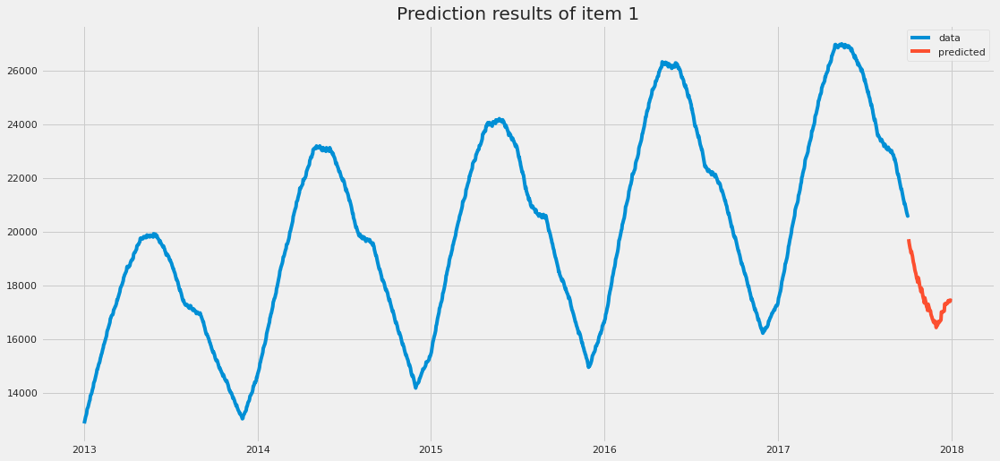

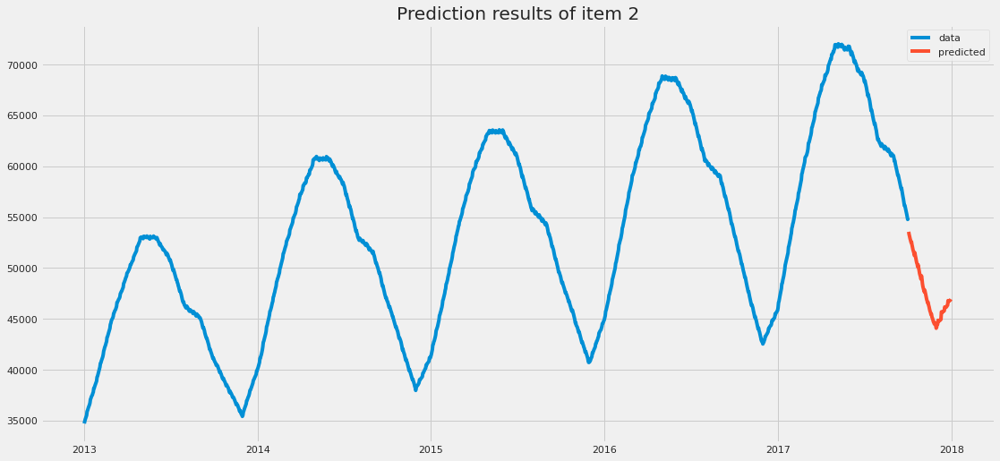

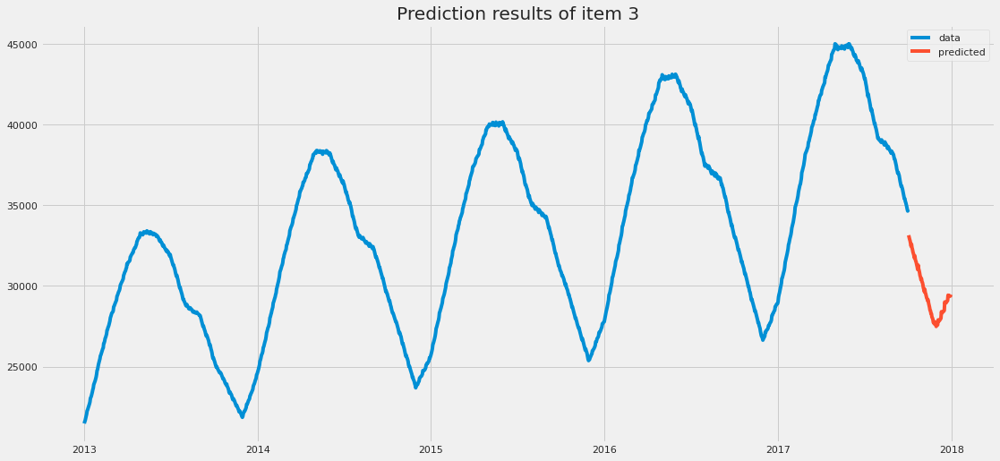

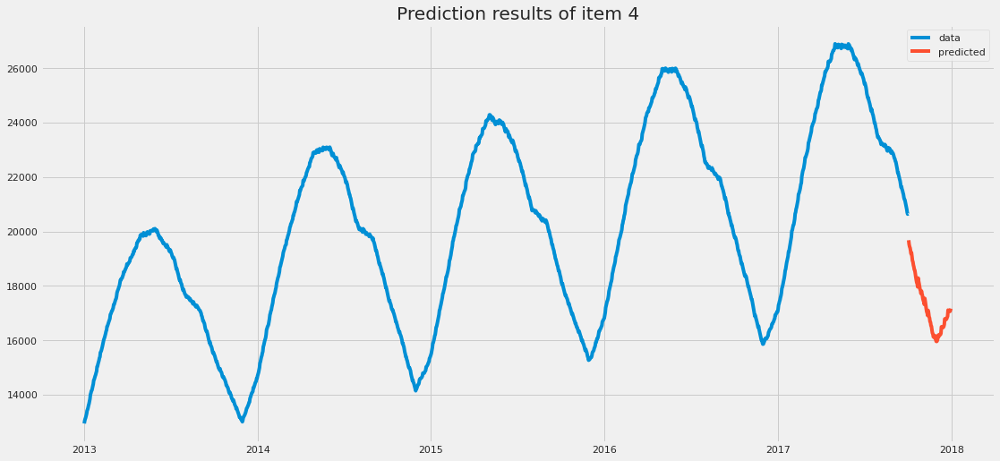

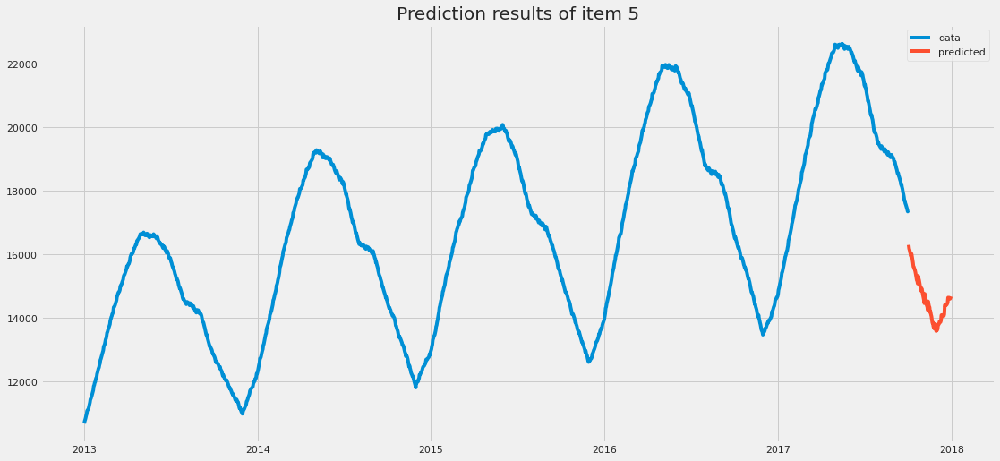

...

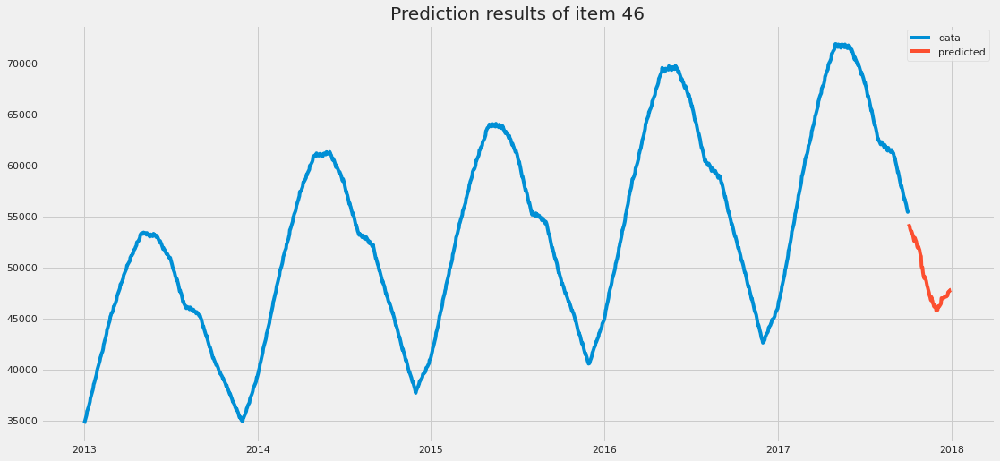

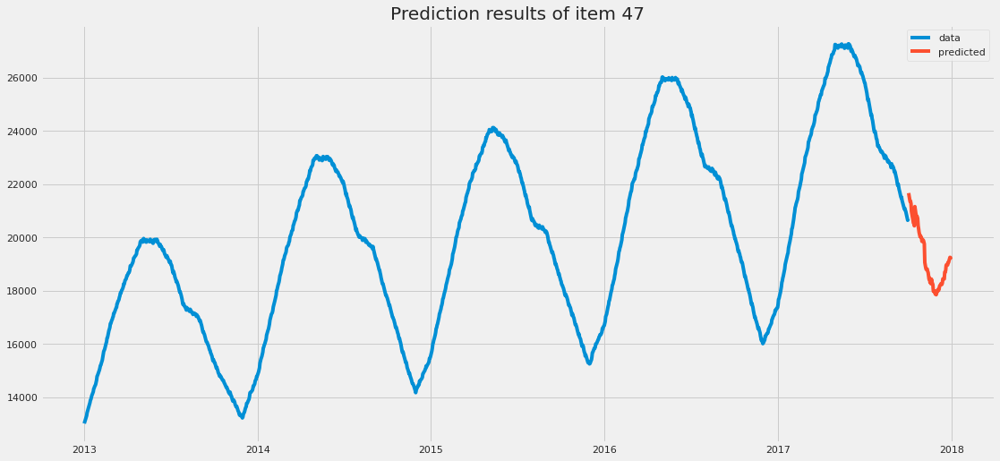

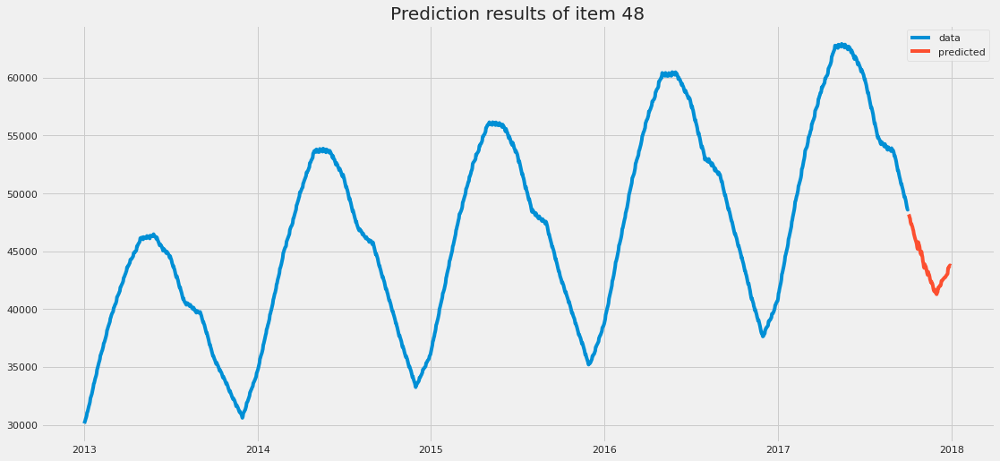

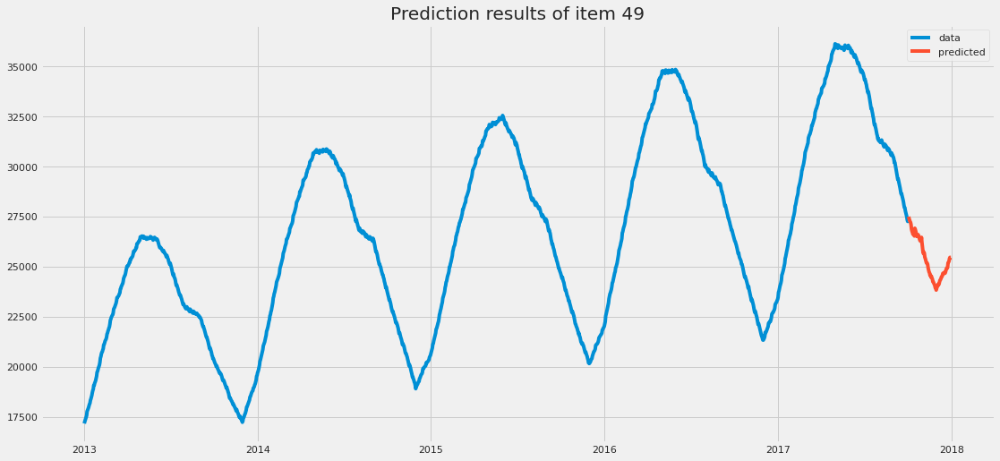

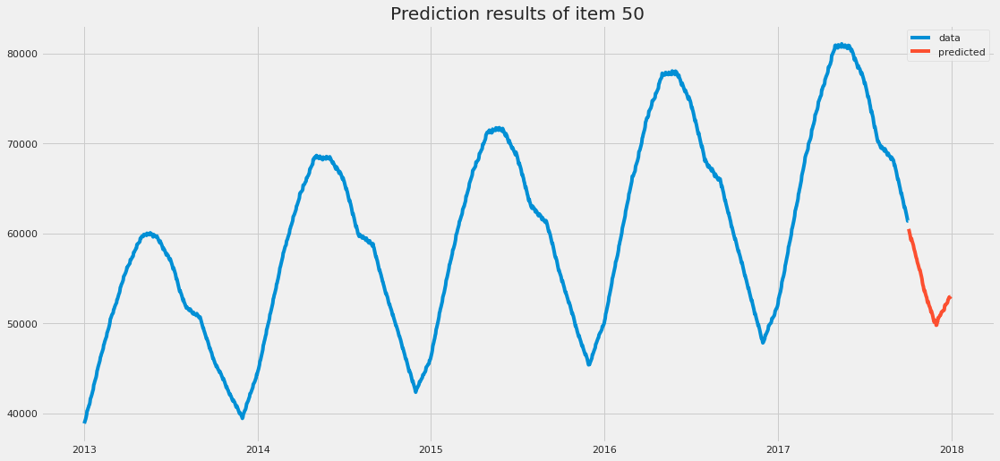

In [75]:
plt.style.use('fivethirtyeight')
for i in item_list:
  
  plot_df=df[df["item"]==i] 
  plot_df = plot_df.set_index('date')
  plot_df_pred=df_pred[df_pred["item"]==i] 
  plot_df_pred=plot_df_pred.set_index('date')
  plt.figure(figsize=(17,8))

  plt.plot(plot_df['sales'], label = 'data')
  plt.plot(plot_df_pred['Prediction'], label = 'predicted')

  
  plt.legend()
  plt.title("Prediction results of item "+str(i))
  plt.show()
  print("\n\n")
  print("===================================================================")
  print("\n\n")

We can notice that the predictions on test set  are giving good results  , let us also check results on validation set 

In [76]:
y_valid=gbr_final.predict(df_valid_x)

In [77]:
y_valid

array([25173.87039017, 68092.32524322, 42256.08342102, ...,
       48339.5254764 , 27570.7146816 , 60710.9727094 ])

In [78]:
df_valid["prediction"]=y_valid

In [79]:
df_valid

,date,item,sales,month,week_of_year,day_of_week,year,is_wknd,is_month_start,is_month_end,quarter,is_quarter_start,is_quarter_end,prediction
82200,2017-07-03,1,25667.0,7,27,0,2017,0,0,0,3,0,0,25173.870390
82201,2017-07-03,2,68421.0,7,27,0,2017,0,0,0,3,0,0,68092.325243
82202,2017-07-03,3,42876.0,7,27,0,2017,0,0,0,3,0,0,42256.083421
82203,2017-07-03,4,25451.0,7,27,0,2017,0,0,0,3,0,0,24979.259972
82204,2017-07-03,5,21350.0,7,27,0,2017,0,0,0,3,0,0,21096.061230
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86795,2017-10-02,46,55565.0,10,40,0,2017,0,0,0,4,0,0,54381.728239
86796,2017-10-02,47,20692.0,10,40,0,2017,0,0,0,4,0,0,21740.748018
86797,2017-10-02,48,48651.0,10,40,0,2017,0,0,0,4,0,0,48339.525476
86798,2017-10-02,49,27275.0,10,40,0,2017,0,0,0,4,0,0,27570.714682


In [80]:
from sklearn.metrics import r2_score
r2_score(y_valid, df_valid_y)

0.99789434523168

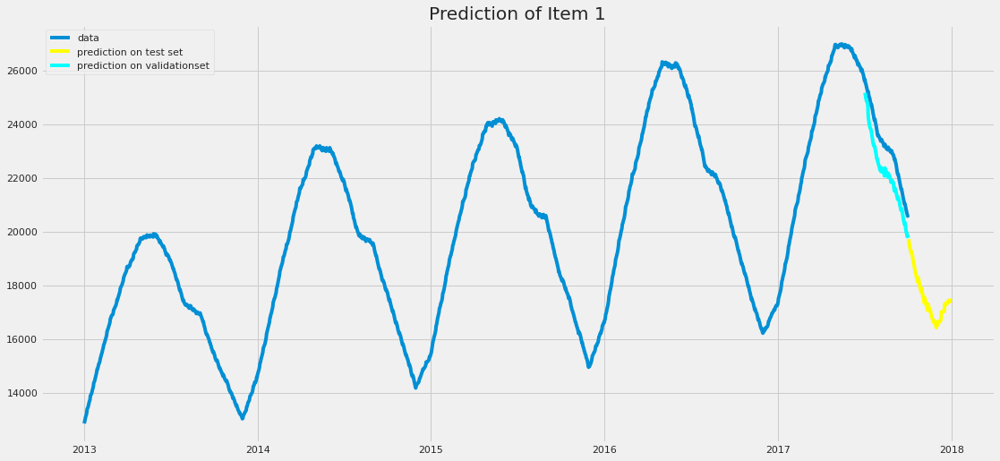

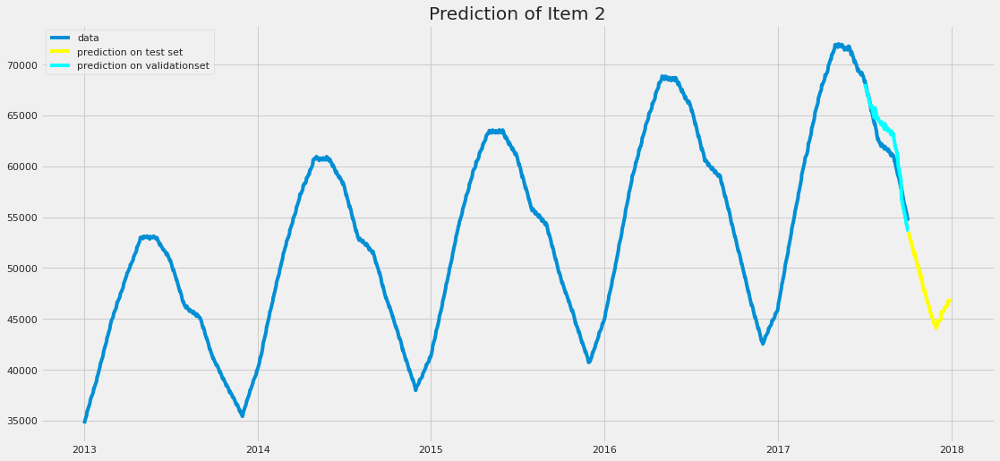

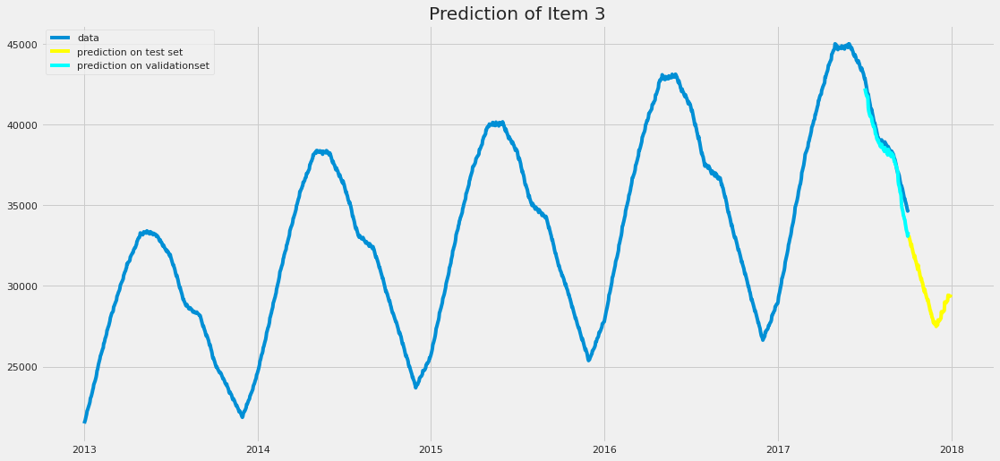

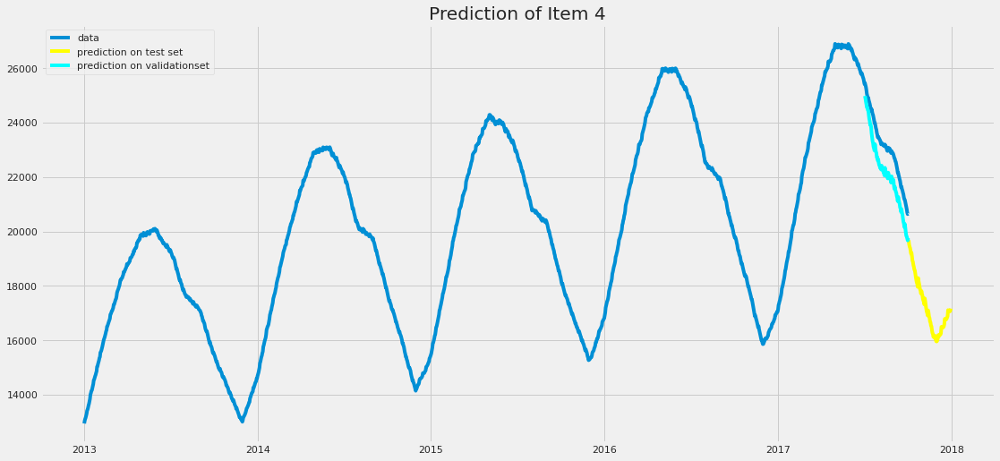

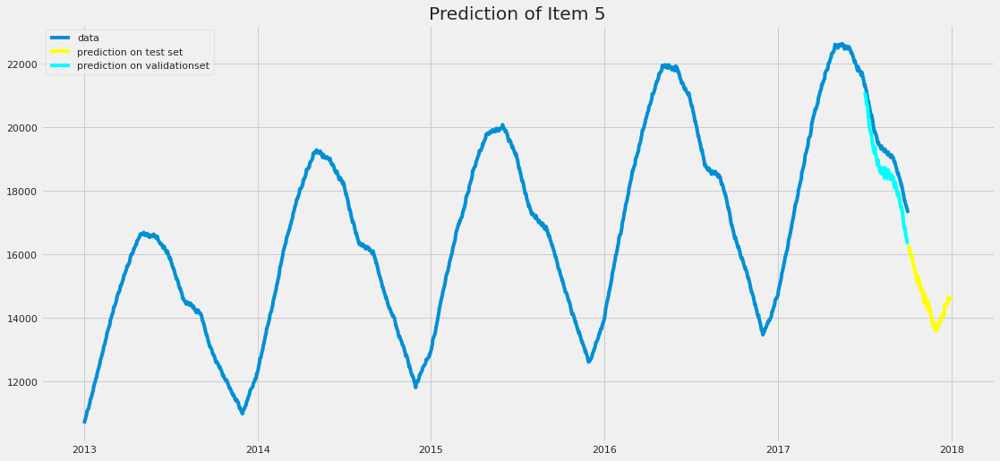

...

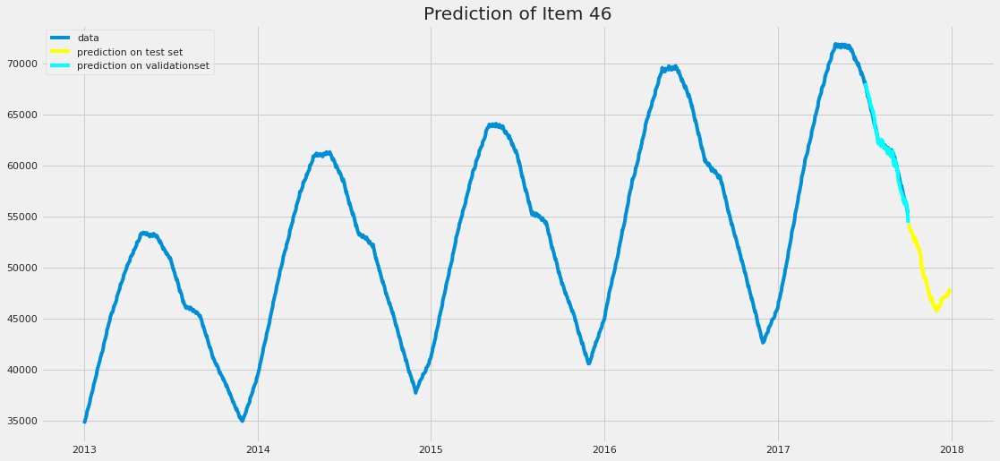

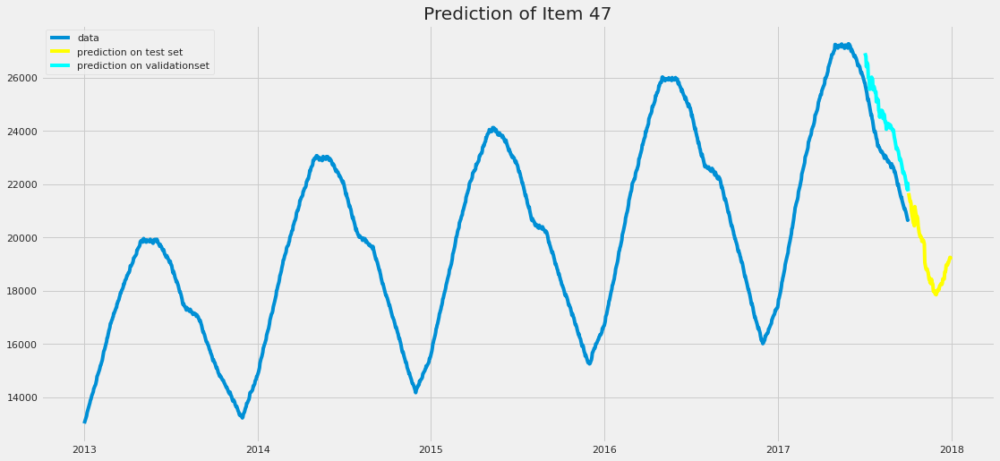

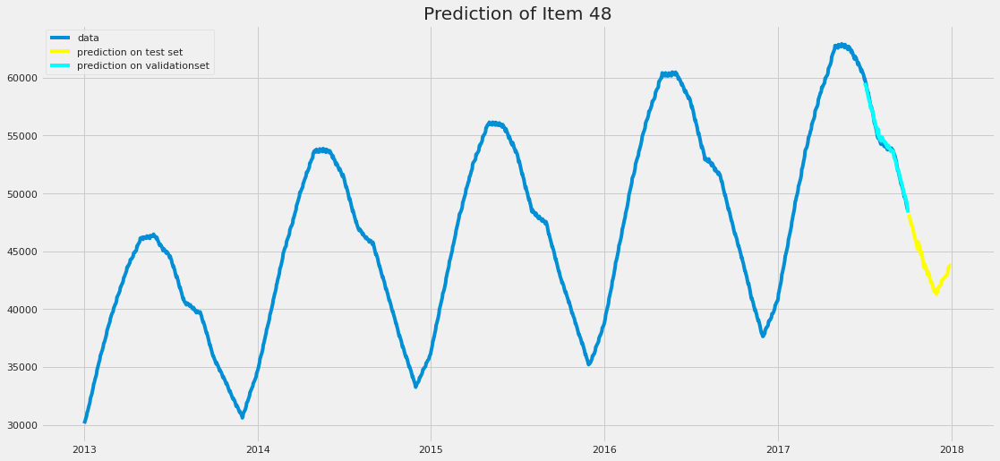

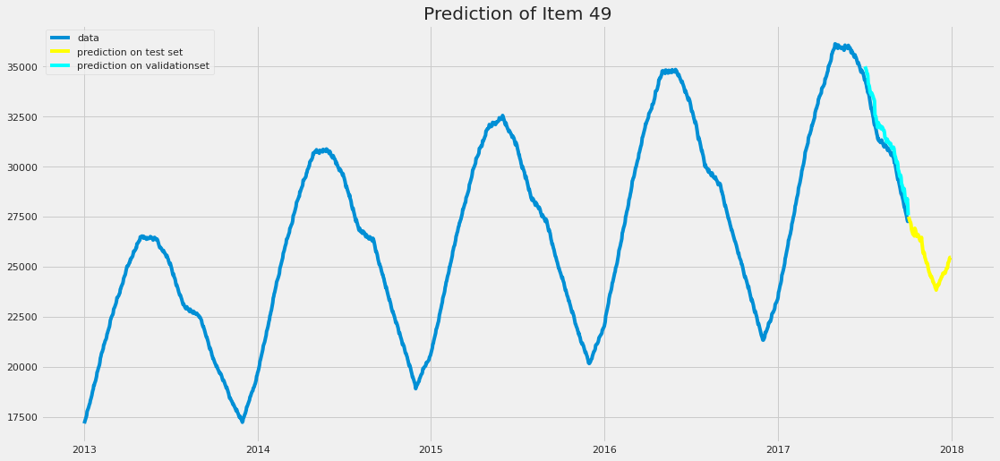

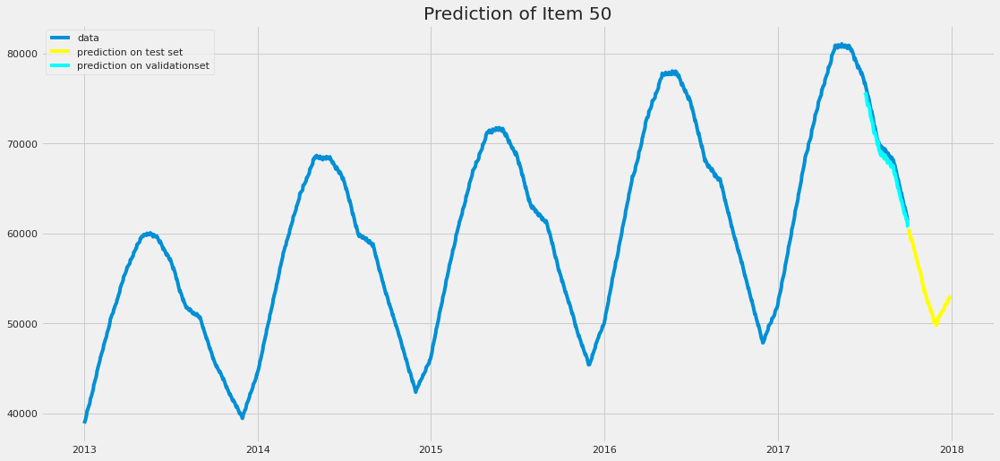

In [86]:
plt.style.use('fivethirtyeight')
for i in item_list:
  
  plot_df=df[df["item"]==i] 
  plot_df = plot_df.set_index('date')
  plot_df_pred=df_pred[df_pred["item"]==i] 
  plot_df_pred=plot_df_pred.set_index('date')
  plot_df_valid=df_valid[df_valid["item"]==i]
  plot_df_valid=plot_df_valid.set_index("date")
  plt.figure(figsize=(17,8))

  plt.plot(plot_df['sales'], label = 'data')
  plt.plot(plot_df_pred['Prediction'], label = 'prediction on test set',c="yellow")
  plt.plot(plot_df_valid["prediction"],label ="prediction on validationset",c="cyan")
  plt.legend()
  plt.title("Prediction of Item "+str(i))
  plt.show()
  print("\n\n")
  print("===================================================================")
  print("\n\n")

In [ ]:
#prediction for the next 90 days for all the products can be seen using df_pred dataset

In [92]:
submit=df_pred[["date","item","Prediction"]]

In [95]:
submit.reset_index(drop=True, inplace=True)
submit

,date,item,Prediction
0,2017-10-03,1,19717.340044
1,2017-10-03,2,53564.494449
2,2017-10-03,3,33147.298124
3,2017-10-03,4,19675.896212
4,2017-10-03,5,16298.641142
...,...,...,...
4495,2017-12-31,46,47817.644661
4496,2017-12-31,47,19183.732309
4497,2017-12-31,48,43739.033133
4498,2017-12-31,49,25452.888952


In [96]:
submit.to_csv("submission",index=False)